In [2]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

In [3]:
# Upload gambar dari laptop
uploaded = files.upload()

# Ambil nama file yang di-upload
filename = list(uploaded.keys())[0]

# Baca gambar dengan OpenCV
img_bgr = cv2.imread(filename)

Saving download.jpeg to download.jpeg


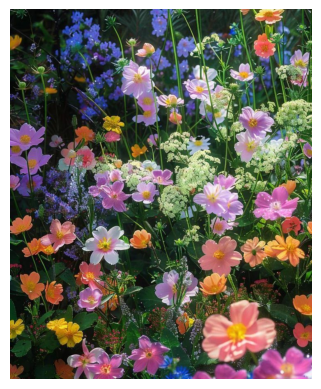

In [4]:
# periksa apakah gambar berhasil masuk
if img_bgr is None:
    print("Error: gambarnya belom masuk")
else:
    # karena cv2 secara default impor pakai color space bgr, ubah dulu ke rgb
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.axis("off")
    plt.imshow(img)

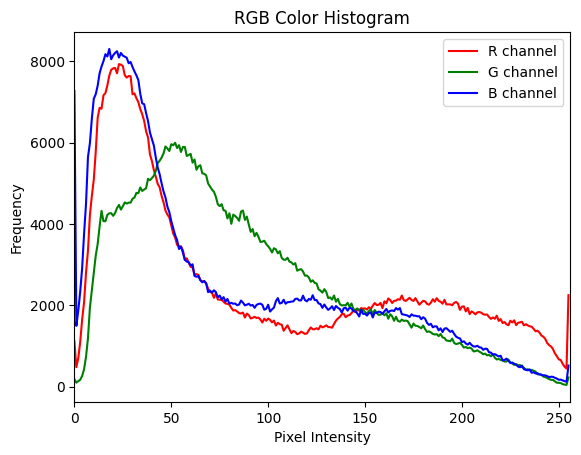

In [5]:
# histogram channel warna RGB foto input
colors = ('r', 'g', 'b')

for i, col in enumerate(colors):
    hist = cv2.calcHist([img], [i], None, [256], [0, 256])
    plt.plot(hist, color=col, label=f"{col.upper()} channel")
    plt.xlim([0, 256])

plt.title("RGB Color Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.show()

**1. RGB ke Grayscale**

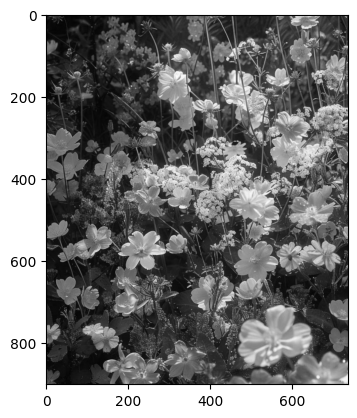

In [6]:
gray_image = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

plt.imshow(gray_image, cmap='gray')

/tmp/ipython-input-3725183237.py:2: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(gray_image.ravel(), 256, [0, 256])


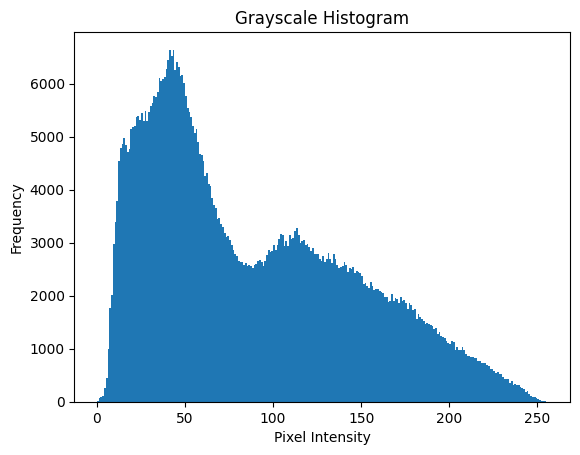

In [7]:
# histogram grayscale gambar input
plt.hist(gray_image.ravel(), 256, [0, 256])
plt.title("Grayscale Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

**2. Grayscale ke Biner**

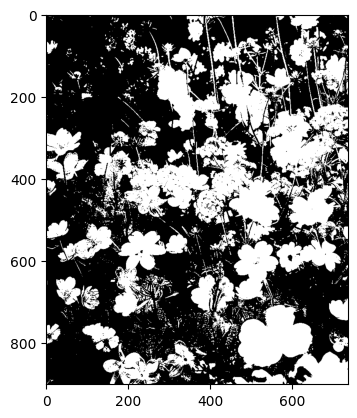

In [8]:
# Mengubah gambar grayscale ke biner dengan threshold otsu (bisa menentukan threshold terbaik otomatis)
(_, binary_image) = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Displaying binary image
plt.imshow(binary_image, cmap='gray')

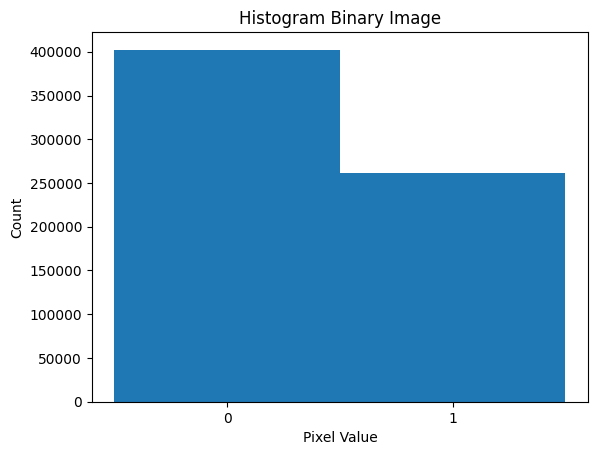

In [9]:
# ubah nilai 255 jadi 1 (biar biner 0 dan 1)
binary_norm = (binary_image // 255).astype(int)

# historagm
plt.hist(binary_norm.flatten(), bins=[-0.5, 0.5, 1.5], ec="k")
plt.xticks([0,1])
plt.xlabel("Pixel Value")
plt.ylabel("Count")
plt.title("Histogram Binary Image")
plt.show()

# penjelasan kode:
# binary_image // 255 -> kalau pixel=0 tetap 0, kalau 255 jadi 1
# bins=[-0.5, 0.5, 1.5] -> supaya batang histogram pas di posisi 0 dan 1

**3. Biner ke Grayscale**

kalau sudah biner berarti gambarnya juga sudah grayscale, yaitu dengan dua nilai yakni 0 (hitam) dan 255 (putih)

**4. RGB ke CMY**

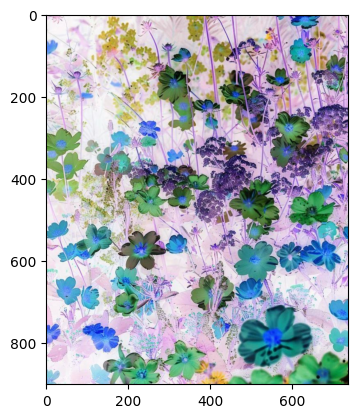

In [10]:
# normalisasi ke range [0,1]
rgb_norm = img.astype(float) / 255.0

# convert ke CMY
cmy = 1 - rgb_norm

# cmy di skala [0, 255]
cmy_255 = (cmy * 255).astype(np.uint8)
plt.imshow(cmy_255)

CMY pada dasarnya adalah invert dari RGB.

*CMY = 1 − RGB*

Monitor menggunakan RGB untuk representasi karena dimulai dari (0, 0, 0) -> hitam, ditambah channel warna menjadi terang yang berarti maksimal (255, 255, 255) -> putih. Sedangkan printer menggunakan CMY dan dimulai dari warna paling terang (kertas putih), ditambahkan tinta warna cyan, magenta, dan yellow (idealnya C + M + Y jadi hitam, tapi biasanya printer menambah K yaitu tinta warna hitam asli jadi CMYK). Jadi, channel CMY kalo dilihat dari monitor -> tetap diperlakukan atau *dibaca* sebagai RGB, makanya warnanya inverted.

Ini kalau CMY mau ditampilkan pakai warna tinta aslinya (cyan, magenta, yellow)

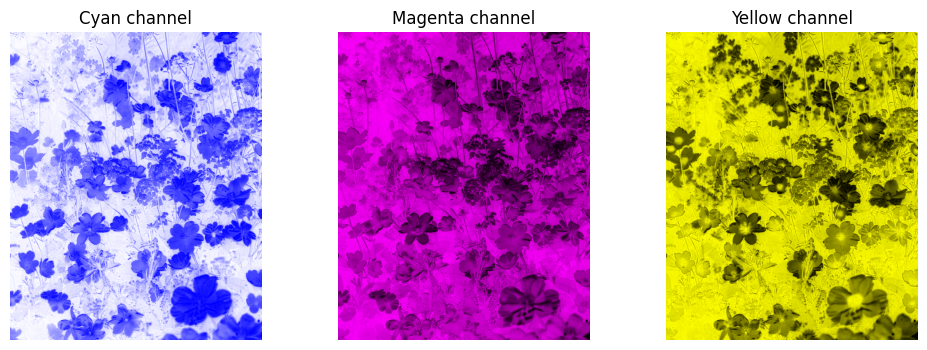

In [11]:
# split channel warnanya
c, m, y = cv2.split(cmy_255)

# create image pakai tinta cmy (versi monitor)
cyan_img = np.zeros_like(img)
cyan_img[:,:,0] = c      # R=0, G=255, B=255 (cyan tint)
cyan_img[:,:,1] = c
cyan_img[:,:,2] = 255

magenta_img = np.zeros_like(img)
magenta_img[:,:,0] = m   # R=255, G=0, B=255 (magenta tint)
magenta_img[:,:,2] = m

yellow_img = np.zeros_like(img)
yellow_img[:,:,0] = y    # R=255, G=255, B=0 (yellow tint)
yellow_img[:,:,1] = y

# tampilkan
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(cyan_img); plt.title("Cyan channel"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(magenta_img); plt.title("Magenta channel"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(yellow_img); plt.title("Yellow channel"); plt.axis("off")
plt.show()

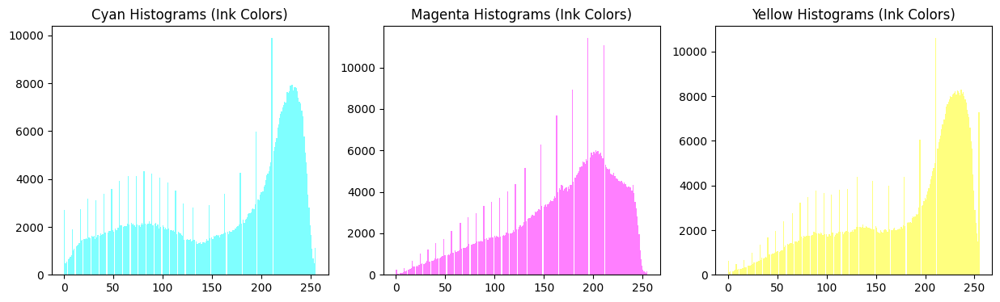

In [12]:
# histogramnya

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1); plt.hist(c.ravel(), bins=256, color=(0,1,1), alpha=0.5, label="Cyan");
plt.title("Cyan Histograms (Ink Colors)")
plt.subplot(1, 3, 2); plt.hist(m.ravel(), bins=256, color=(1,0,1), alpha=0.5, label="Magenta");
plt.title("Magenta Histograms (Ink Colors)")
plt.subplot(1, 3, 3); plt.hist(y.ravel(), bins=256, color=(1,1,0), alpha=0.5, label="Yellow");
plt.title("Yellow Histograms (Ink Colors)")
plt.show()


**5. RGB ke HSI**

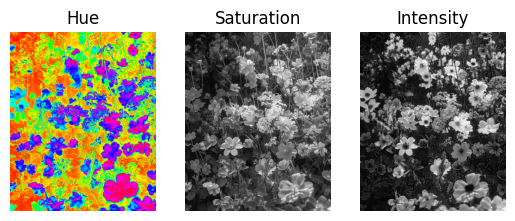

In [13]:
def rgb_ke_hsi(rgb_img):
  # ambil input gambar (rgb_img) lalu normalisasi ke 0-1, lalu pisahkan jadi channel R,G,B
  rgb_normalisasi = rgb_img.astype(np.float32) / 255.0
  R, G, B = rgb_normalisasi[:,:,0], rgb_normalisasi[:,:,1], rgb_normalisasi[:,:,2]

  # intensitas (rata-rata R,G,B)
  I = (R + G + B)/3.0

  # saturasi
  min_rgb = np.minimum(np.minimum(R,G), B) # ambil minimum antara R dan G habis itu ambil lagi minimum dengan B sama aja seperti min(R,G,B)
  S = 1 - (3 / (R+ G + B + 1e-6)) * min_rgb # 1e-6 biar dia gak dibagi sama 0

  # hue
  num = 0.5 * ((R - G) + (R - B)) # pembilang
  den = np.sqrt((R - G)**2 + (R - B)*(G - B)) + 1e-6 # penyebut
  theta = np.arccos(np.clip(num / den, -1, 1)) # memastikan nilai ada di rentang valid [-1,1] syarat arccos
  # hasil theta: sudut (radian) yang merepresentasikan hue yang dihitung dari kombinasi RGB

  H = theta.copy()
  H[B > G] = 2*np.pi - H[B > G] # kalau B > G, sudut harus dikoreksi (2 phi - theta)
  H = H / (2*np.pi) # normalisasi ke [0,1] jadinya H=0 (merah), H=0.33 (hijau), dan H=0.66 (biru)

  # satuin tiga channel H,S,I jadi 1 citra 3D lagi
  HSI = np.dstack((H, S, I))
  return HSI

plt.subplot(1,3,1)
plt.imshow(img[:,:,0], cmap='hsv')  # ambil channel ke-0 (hue) tampilinn hsv biar keliatan, soalnya kalo grayscale warnanya ga jelas maknanya
plt.title("Hue")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(img[:,:,1], cmap='gray') # ambil channel ke-1 (saturation)
plt.title("Saturation")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(img[:,:,2], cmap='gray') # ambil channel ke-2 (intensity)
plt.title("Intensity")
plt.axis("off")

plt.show()

**6. RGB ke YCbCr**

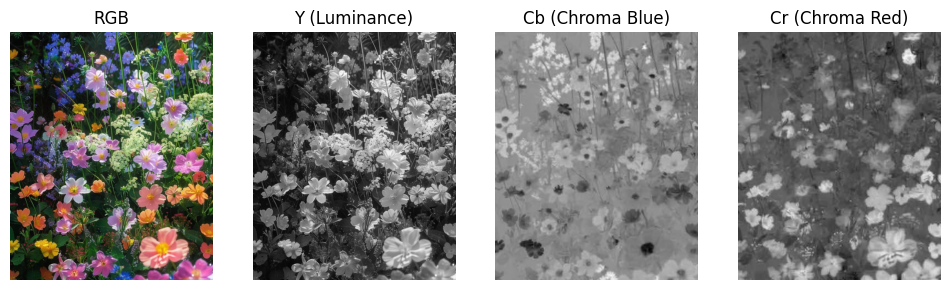

In [14]:
# img udah rgb
ycbcr_img = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)

# pisahin masing-masing channelnya
Y, Cr, Cb = cv2.split(ycbcr_img)

# Tampilkan
plt.figure(figsize=(12,4))

plt.subplot(1,4,1)
plt.imshow(img)
plt.title("RGB")
plt.axis("off")

plt.subplot(1,4,2)
plt.imshow(Y, cmap='gray')
plt.title("Y (Luminance)")
plt.axis("off")

plt.subplot(1,4,3)
plt.imshow(Cb, cmap='gray')
plt.title("Cb (Chroma Blue)")
plt.axis("off")

plt.subplot(1,4,4)
plt.imshow(Cr, cmap='gray')
plt.title("Cr (Chroma Red)")
plt.axis("off")

plt.show()

**7. CMY ke RGB**

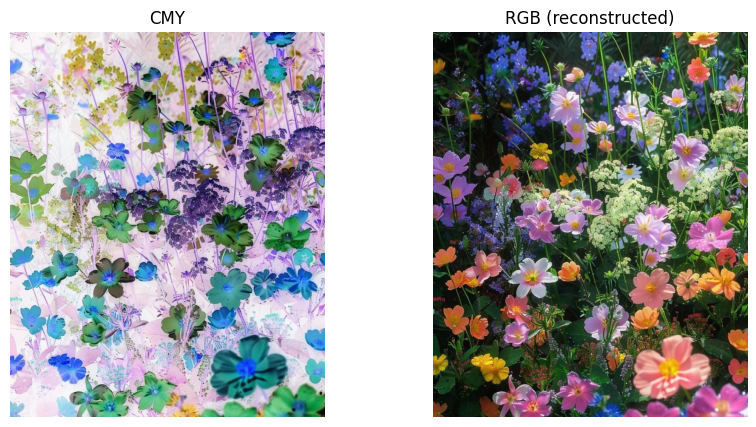

In [15]:
# cmy_255 dari hasil sebelumnya
cmy_norm = cmy_255.astype(float) / 255.0   # normalisasi ke 0 dan 1

# konversi balik ke RGB
rgb_reconstructed = 1 - cmy_norm

# skala balik ke [0,255] supaya bisa ditampilin / disimpan
rgb_255 = (rgb_reconstructed * 255).astype(np.uint8)

# lihat perbandingannya
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(cmy_255)
plt.title("CMY")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(rgb_255)
plt.title("RGB (reconstructed)")
plt.axis("off")

plt.show()

**8. CMY ke HSI**

konversi CMY ke HSI caranya adalah:
1. CMY ke RGB
2. RGB ke HSI

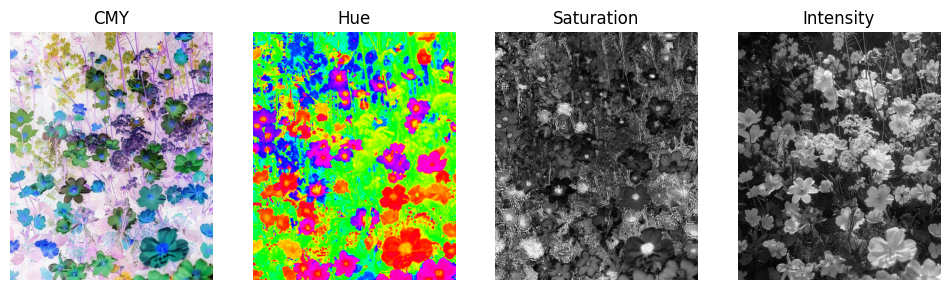

In [16]:
# step 1: cmy ke rgb
cmy_norm = cmy_255.astype(float) / 255.0
rgb_dari_cmy = 1 - cmy_norm
rgb_255 = (rgb_dari_cmy * 255).astype(np.uint8)

# step 2: rgb ke hsi (pakai fungsi yang udah dibuat sebelumnya)
hsi_dari_cmy = rgb_ke_hsi(rgb_255)


# visualisasi
plt.figure(figsize=(12,4))

plt.subplot(1,4,1)
plt.imshow(cmy_255)
plt.title("CMY")
plt.axis("off")

plt.subplot(1,4,2)
plt.imshow(hsi_dari_cmy[:,:,0], cmap='hsv')
plt.title("Hue")
plt.axis("off")

plt.subplot(1,4,3)
plt.imshow(hsi_dari_cmy[:,:,1], cmap='gray')
plt.title("Saturation")
plt.axis("off")

plt.subplot(1,4,4)
plt.imshow(hsi_dari_cmy[:,:,2], cmap='gray')
plt.title("Intensity")
plt.axis("off")

plt.show()

**9. CMY ke YCbCr**

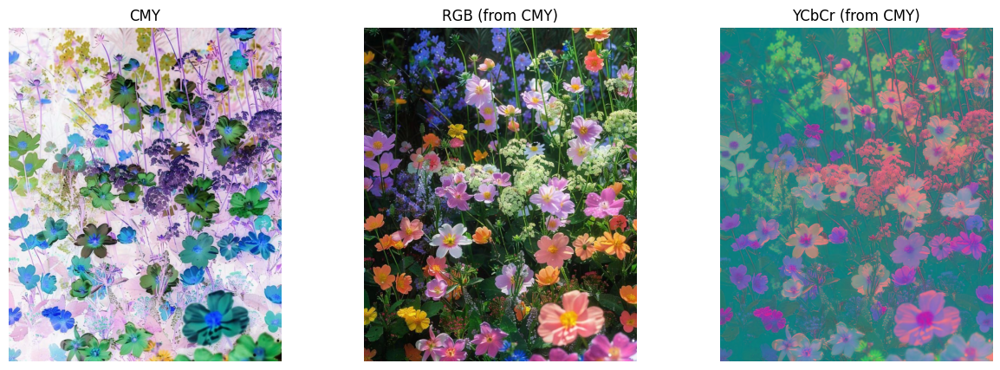

In [17]:
# cmy_255 dari hasil sebelumnya
cmy_norm = cmy_255.astype(float) / 255.0   # normalisasi ke 0 dan 1

# konversi balik ke RGB
rgb_reconstructed = 1 - cmy_norm

# skala balik ke [0,255] supaya bisa ditampilin / disimpan
rgb_255 = (rgb_reconstructed * 255).astype(np.uint8)

# RGB -> YCbCr
R = rgb_255[:, :, 0].astype(float)
G = rgb_255[:, :, 1].astype(float)
B = rgb_255[:, :, 2].astype(float)

Y  = 0.299 * R + 0.587 * G + 0.114 * B
Cb = 128 - 0.168736 * R - 0.331264 * G + 0.5 * B
Cr = 128 + 0.5 * R - 0.418688 * G - 0.081312 * B

# gabung jadi 3 channel
ycbcr = np.stack((Y, Cb, Cr), axis=-1).clip(0, 255).astype(np.uint8)

# Tampilkan
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(cmy_255)
plt.title("CMY")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(rgb_255)
plt.title("RGB (from CMY)")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(ycbcr)
plt.title("YCbCr (from CMY)")
plt.axis("off")

plt.show()


**HSI notes**

HSI selalu dikonversi ke RGB terlebih dahulu sebelum diubah ke model warna lain karena hampir semua sistem penyimpanan dan pemrosesan citra digital menggunakan RGB sebagai format dasarnya. Model seperti CMY maupun YCbCr memang didefinisikan langsung berdasarkan nilai RGB, bukan HSI. Sementara itu, HSI hanya merupakan representasi matematis untuk mendekati persepsi visual manusia terhadap warna (hue, saturation, intensity), sehingga tidak digunakan secara langsung dalam penyimpanan citra. Oleh karena itu, jalur konversi yang umum dilakukan adalah HSI → RGB → model lain, agar transformasi dapat mengikuti standar definisi warna yang ada.

**10. HSI ke RGB**

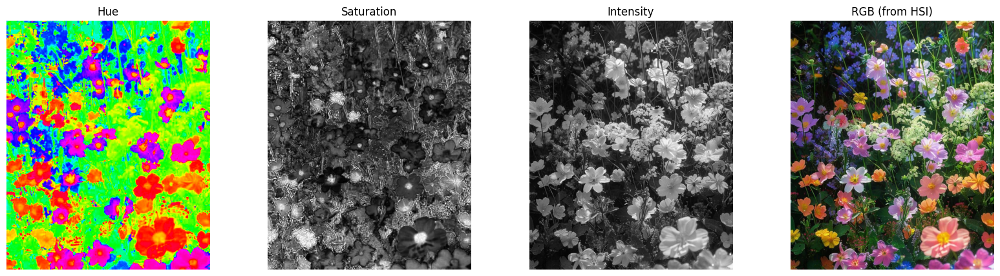

In [18]:
def hsi_ke_rgb(HSI):
    # Pisahkan channel
    H = HSI[:,:,0] * 2 * np.pi   # Hue [0,1] → [0,2 phi]
    S = HSI[:,:,1]
    I = HSI[:,:,2]

    # Siapkan array kosong
    R = np.zeros_like(H)
    G = np.zeros_like(H)
    B = np.zeros_like(H)

    # Sektor 0° - 120°
    idx = (H >= 0) & (H < 2*np.pi/3)
    B[idx] = I[idx] * (1 - S[idx])
    R[idx] = I[idx] * (1 + (S[idx] * np.cos(H[idx])) /
                       (np.cos(np.pi/3 - H[idx]) + 1e-6))
    G[idx] = 3*I[idx] - (R[idx] + B[idx])

    # Sektor 120° - 240°
    idx = (H >= 2*np.pi/3) & (H < 4*np.pi/3)
    H2 = H[idx] - 2*np.pi/3
    R[idx] = I[idx] * (1 - S[idx])
    G[idx] = I[idx] * (1 + (S[idx] * np.cos(H2)) /
                       (np.cos(np.pi/3 - H2) + 1e-6))
    B[idx] = 3*I[idx] - (R[idx] + G[idx])

    # Sektor 240° - 360°
    idx = (H >= 4*np.pi/3) & (H < 2*np.pi)
    H3 = H[idx] - 4*np.pi/3
    G[idx] = I[idx] * (1 - S[idx])
    B[idx] = I[idx] * (1 + (S[idx] * np.cos(H3)) /
                       (np.cos(np.pi/3 - H3) + 1e-6))
    R[idx] = 3*I[idx] - (G[idx] + B[idx])

    # Gabung channel dan skala ke [0,255]
    rgb = np.stack((R, G, B), axis=-1).clip(0, 1)
    rgb_255 = (rgb * 255).astype(np.uint8)

    return rgb_255

rgb_dari_hsi = hsi_ke_rgb(hsi_dari_cmy)

plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.imshow(hsi_dari_cmy[:,:,0], cmap='hsv')
plt.title("Hue")
plt.axis("off")

plt.subplot(1,4,2)
plt.imshow(hsi_dari_cmy[:,:,1], cmap='gray')
plt.title("Saturation")
plt.axis("off")

plt.subplot(1,4,3)
plt.imshow(hsi_dari_cmy[:,:,2], cmap='gray')
plt.title("Intensity")
plt.axis("off")

plt.subplot(1,4,4)
plt.imshow(rgb_dari_hsi)
plt.title("RGB (from HSI)")
plt.axis("off")

plt.show()

**11. HSI ke CMY**

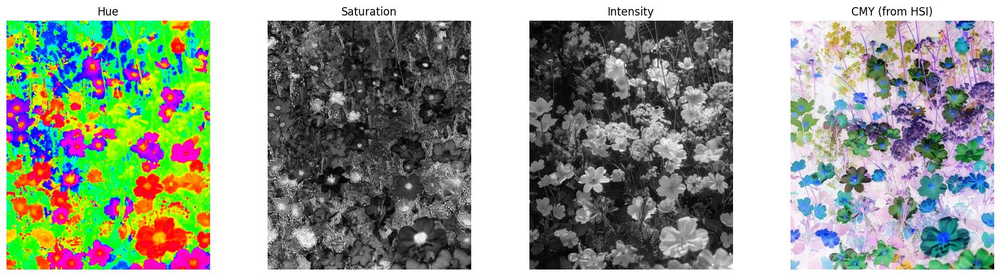

In [19]:
# Fungsi HSI -> RGB
def hsi_ke_rgb(HSI):
    H = HSI[:,:,0] * 2 * np.pi   # Hue [0,1] → [0,2 phi]
    S = HSI[:,:,1]
    I = HSI[:,:,2]

    R = np.zeros_like(H)
    G = np.zeros_like(H)
    B = np.zeros_like(H)

    # Sektor 0° - 120°
    idx = (H >= 0) & (H < 2*np.pi/3)
    B[idx] = I[idx] * (1 - S[idx])
    R[idx] = I[idx] * (1 + (S[idx] * np.cos(H[idx])) /
                       (np.cos(np.pi/3 - H[idx]) + 1e-6))
    G[idx] = 3*I[idx] - (R[idx] + B[idx])

    # Sektor 120° - 240°
    idx = (H >= 2*np.pi/3) & (H < 4*np.pi/3)
    H2 = H[idx] - 2*np.pi/3
    R[idx] = I[idx] * (1 - S[idx])
    G[idx] = I[idx] * (1 + (S[idx] * np.cos(H2)) /
                       (np.cos(np.pi/3 - H2) + 1e-6))
    B[idx] = 3*I[idx] - (R[idx] + G[idx])

    # Sektor 240° - 360°
    idx = (H >= 4*np.pi/3) & (H < 2*np.pi)
    H3 = H[idx] - 4*np.pi/3
    G[idx] = I[idx] * (1 - S[idx])
    B[idx] = I[idx] * (1 + (S[idx] * np.cos(H3)) /
                       (np.cos(np.pi/3 - H3) + 1e-6))
    R[idx] = 3*I[idx] - (G[idx] + B[idx])

    rgb = np.stack((R, G, B), axis=-1).clip(0, 1)
    rgb_255 = (rgb * 255).astype(np.uint8)

    return rgb_255


# Fungsi RGB -> CMY
def rgb_ke_cmy(rgb_img):
    rgb_norm = rgb_img.astype(np.float32) / 255.0
    cmy = 1 - rgb_norm
    cmy_255 = (cmy * 255).astype(np.uint8)
    return cmy_255

# Step 1: HSI -> RGB
rgb_dari_hsi = hsi_ke_rgb(hsi_dari_cmy)

# Step 2: RGB -> CMY
cmy_dari_hsi = rgb_ke_cmy(rgb_dari_hsi)

# Plot hasil
plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.imshow(hsi_dari_cmy[:,:,0], cmap='hsv')
plt.title("Hue")
plt.axis("off")

plt.subplot(1,4,2)
plt.imshow(hsi_dari_cmy[:,:,1], cmap='gray')
plt.title("Saturation")
plt.axis("off")

plt.subplot(1,4,3)
plt.imshow(hsi_dari_cmy[:,:,2], cmap='gray')
plt.title("Intensity")
plt.axis("off")

plt.subplot(1,4,4)
plt.imshow(cmy_dari_hsi)
plt.title("CMY (from HSI)")
plt.axis("off")

plt.show()


**12. HSI ke YCbCr**

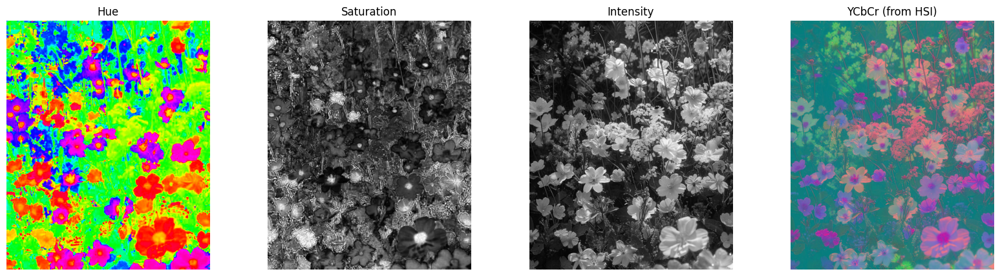

In [20]:
# Fungsi HSI -> RGB
def hsi_ke_rgb(HSI):
    H = HSI[:,:,0] * 2 * np.pi   # Hue [0,1] → [0,2 phi]
    S = HSI[:,:,1]
    I = HSI[:,:,2]

    R = np.zeros_like(H)
    G = np.zeros_like(H)
    B = np.zeros_like(H)

    # Sektor 0° - 120°
    idx = (H >= 0) & (H < 2*np.pi/3)
    B[idx] = I[idx] * (1 - S[idx])
    R[idx] = I[idx] * (1 + (S[idx] * np.cos(H[idx])) /
                       (np.cos(np.pi/3 - H[idx]) + 1e-6))
    G[idx] = 3*I[idx] - (R[idx] + B[idx])

    # Sektor 120° - 240°
    idx = (H >= 2*np.pi/3) & (H < 4*np.pi/3)
    H2 = H[idx] - 2*np.pi/3
    R[idx] = I[idx] * (1 - S[idx])
    G[idx] = I[idx] * (1 + (S[idx] * np.cos(H2)) /
                       (np.cos(np.pi/3 - H2) + 1e-6))
    B[idx] = 3*I[idx] - (R[idx] + G[idx])

    # Sektor 240° - 360°
    idx = (H >= 4*np.pi/3) & (H < 2*np.pi)
    H3 = H[idx] - 4*np.pi/3
    G[idx] = I[idx] * (1 - S[idx])
    B[idx] = I[idx] * (1 + (S[idx] * np.cos(H3)) /
                       (np.cos(np.pi/3 - H3) + 1e-6))
    R[idx] = 3*I[idx] - (G[idx] + B[idx])

    rgb = np.stack((R, G, B), axis=-1).clip(0, 1)
    rgb_255 = (rgb * 255).astype(np.uint8)

    return rgb_255



# Fungsi RGB -> YCbCr
def rgb_ke_ycbcr(rgb_img):
    R = rgb_img[:,:,0].astype(float)
    G = rgb_img[:,:,1].astype(float)
    B = rgb_img[:,:,2].astype(float)

    Y  = 0.299 * R + 0.587 * G + 0.114 * B
    Cb = 128 - 0.168736 * R - 0.331264 * G + 0.5 * B
    Cr = 128 + 0.5 * R - 0.418688 * G - 0.081312 * B

    ycbcr = np.stack((Y, Cb, Cr), axis=-1).clip(0, 255).astype(np.uint8)
    return ycbcr

# Step 1: HSI -> RGB
rgb_dari_hsi = hsi_ke_rgb(hsi_dari_cmy)

# Step 2: RGB -> YCbCr
ycbcr_dari_hsi = rgb_ke_ycbcr(rgb_dari_hsi)

# -------------------------
# Plot hasil
# -------------------------
plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.imshow(hsi_dari_cmy[:,:,0], cmap='hsv')
plt.title("Hue")
plt.axis("off")

plt.subplot(1,4,2)
plt.imshow(hsi_dari_cmy[:,:,1], cmap='gray')
plt.title("Saturation")
plt.axis("off")

plt.subplot(1,4,3)
plt.imshow(hsi_dari_cmy[:,:,2], cmap='gray')
plt.title("Intensity")
plt.axis("off")

plt.subplot(1,4,4)
plt.imshow(ycbcr_dari_hsi)
plt.title("YCbCr (from HSI)")
plt.axis("off")

plt.show()


**13. YCbCr ke RGB**

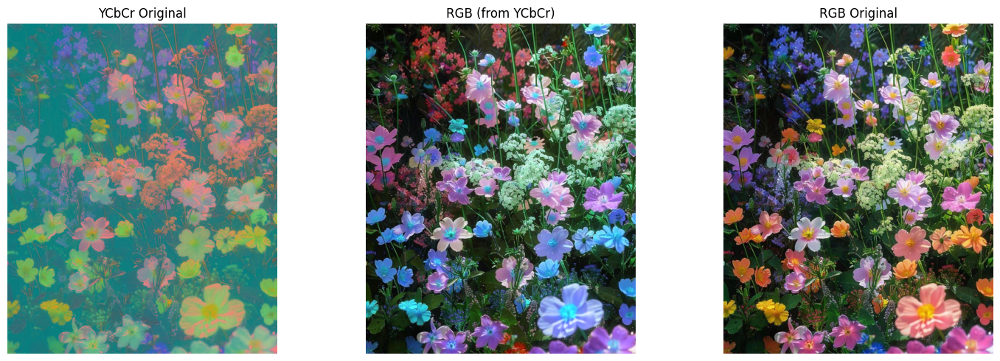

In [21]:
def ycbcr_ke_rgb(ycbcr_img):
    # memisahkan channel Y, Cb, Cr
    Y = ycbcr_img[:,:,0].astype(float)
    Cb = ycbcr_img[:,:,1].astype(float)
    Cr = ycbcr_img[:,:,2].astype(float)

    # melakukan konversi ke RGB memakai formula
    R = Y + 1.402 * (Cr - 128)
    G = Y - 0.344136 * (Cb - 128) - 0.714136 * (Cr - 128)
    B = Y + 1.772 * (Cb - 128)

    # mengabungkan dan clip ke range [0, 255]
    rgb = np.stack((R, G, B), axis=-1).clip(0, 255).astype(np.uint8)
    return rgb

# konversi YCbCr ke RGB
rgb_dari_ycbcr = ycbcr_ke_rgb(ycbcr_img)

# hasil
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(ycbcr_img)
plt.title("YCbCr Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(rgb_dari_ycbcr)
plt.title("RGB (from YCbCr)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(img)
plt.title("RGB Original")
plt.axis("off")

plt.tight_layout()
plt.show()

**14. YCbCr ke CMY**

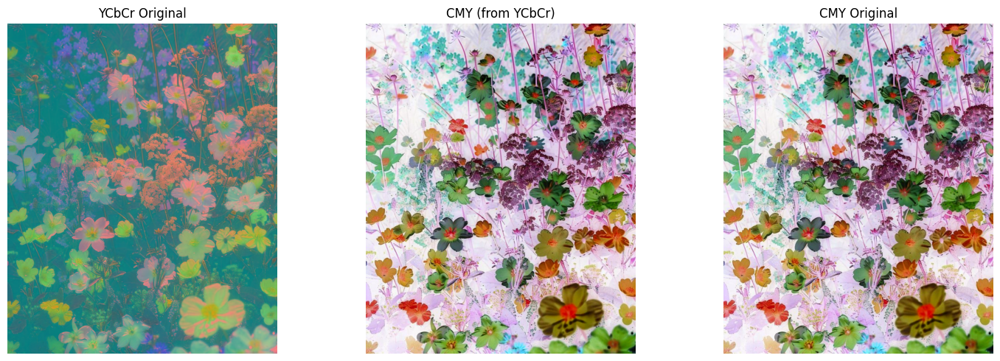

In [26]:
def ycbcr_ke_cmy(ycbcr_img):
    # step 1: YCbCr -> RGB
    rgb_dari_ycbcr = ycbcr_ke_rgb(ycbcr_img)

    # step 2: RGB -> CMY
    rgb_norm = rgb_dari_ycbcr.astype(np.float32) / 255.0
    cmy = 1 - rgb_norm
    cmy_255 = (cmy * 255).astype(np.uint8)

    return cmy_255

# konversi YCbCr ke CMY
cmy_dari_ycbcr = ycbcr_ke_cmy(ycbcr_img)

# hasil
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(ycbcr_img)
plt.title("YCbCr Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(cmy_dari_ycbcr)
plt.title("CMY (from YCbCr)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cmy_dari_ycbcr)
plt.title("CMY Original")
plt.axis("off")

plt.tight_layout()
plt.show()

**15. YCbCr ke HSI**

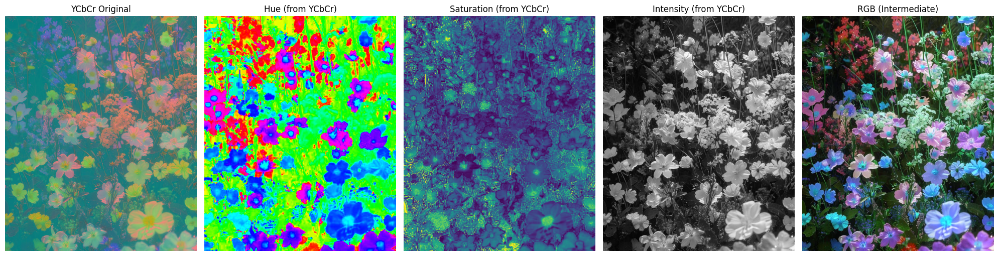

In [27]:
def ycbcr_ke_hsi(ycbcr_img):
    # step 1: YCbCr -> RGB
    rgb_dari_ycbcr = ycbcr_ke_rgb(ycbcr_img)

    # step 2: RGB -> HSI
    hsi_dari_ycbcr = rgb_ke_hsi(rgb_dari_ycbcr)

    return hsi_dari_ycbcr, rgb_dari_ycbcr

# konversi YCbCr ke HSI
hsi_dari_ycbcr, rgb_dari_ycbcr = ycbcr_ke_hsi(ycbcr_img)

# hasil
plt.figure(figsize=(20, 5))

plt.subplot(1, 5, 1)
plt.imshow(ycbcr_img)
plt.title("YCbCr Original")
plt.axis("off")

plt.subplot(1, 5, 2)
plt.imshow(hsi_dari_ycbcr[:,:,0], cmap='hsv')
plt.title("Hue (from YCbCr)")
plt.axis("off")

plt.subplot(1, 5, 3)
plt.imshow(hsi_dari_ycbcr[:,:,1], cmap='viridis')
plt.title("Saturation (from YCbCr)")
plt.axis("off")

plt.subplot(1, 5, 4)
plt.imshow(hsi_dari_ycbcr[:,:,2], cmap='gray')
plt.title("Intensity (from YCbCr)")
plt.axis("off")

plt.subplot(1, 5, 5)
plt.imshow(rgb_dari_ycbcr)
plt.title("RGB (Intermediate)")
plt.axis("off")

plt.tight_layout()
plt.show()